In [35]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ibm-hr-analytics-attrition-dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv


In [36]:
from matplotlib import pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

%matplotlib inline 

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn import  metrics 
from sklearn.metrics import confusion_matrix, accuracy_score, make_scorer



In [37]:
#loading data

data=pd.read_csv("../input/ibm-hr-analytics-attrition-dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv")
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


## Data exploration

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [ ]:
data.describe()

**pandas profiling is great way of looking at data**

In [67]:
import pandas_profiling as pp
pp.ProfileReport(data)

Following are some useful insights from pandas profiling:-

  --MonthlyIncome and JobLevel are higly correlated with each other, people with higher job level tends of high salary.
  
  --JobRole and Department;some department have more core values like Research & Development so it has more and important JobRole.
  
  --EmployeeCount,Over18 and StandardHours have constant value and standard deviation of zero we can drop them
 

### Dividing numerical and categorical data

In [39]:
# taking categorical features only
df_cat=data.loc[:,data.dtypes==np.object]

In [40]:
#Droping 'Over18'
#Attrition is target variable so will drop it too
df_cat=df_cat.drop(['Attrition','Over18'], axis=1)
df_cat

,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Yes
1,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,No
2,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Yes
3,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Yes
4,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,No
...,...,...,...,...,...,...,...
1465,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,No
1466,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,No
1467,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Yes
1468,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,No


In [41]:
#taking numerical fetures only
df_num=data.loc[:,data.dtypes==np.int64]
df_num

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,...,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,...,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,...,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,...,3,80,1,17,3,3,5,2,0,3
1466,39,613,6,1,1,2062,4,42,2,3,...,1,80,1,9,5,3,7,7,1,7
1467,27,155,4,3,1,2064,2,87,4,2,...,2,80,1,6,0,3,6,2,0,3
1468,49,1023,2,3,1,2065,4,63,2,2,...,4,80,0,17,3,2,9,6,0,8


In [42]:
#droping numeric features which are constant
df_num=df_num.drop(['EmployeeCount','StandardHours'], axis=1)
df_num

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,2,94,3,2,4,...,3,1,0,8,0,1,6,4,0,5
1,49,279,8,1,2,3,61,2,2,2,...,4,4,1,10,3,3,10,7,1,7
2,37,1373,2,2,4,4,92,2,1,3,...,3,2,0,7,3,3,0,0,0,0
3,33,1392,3,4,5,4,56,3,1,3,...,3,3,0,8,3,3,8,7,3,0
4,27,591,2,1,7,1,40,3,1,2,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,2061,3,41,4,2,4,...,3,3,1,17,3,3,5,2,0,3
1466,39,613,6,1,2062,4,42,2,3,1,...,3,1,1,9,5,3,7,7,1,7
1467,27,155,4,3,2064,2,87,4,2,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,1023,2,3,2065,4,63,2,2,2,...,3,4,0,17,3,2,9,6,0,8


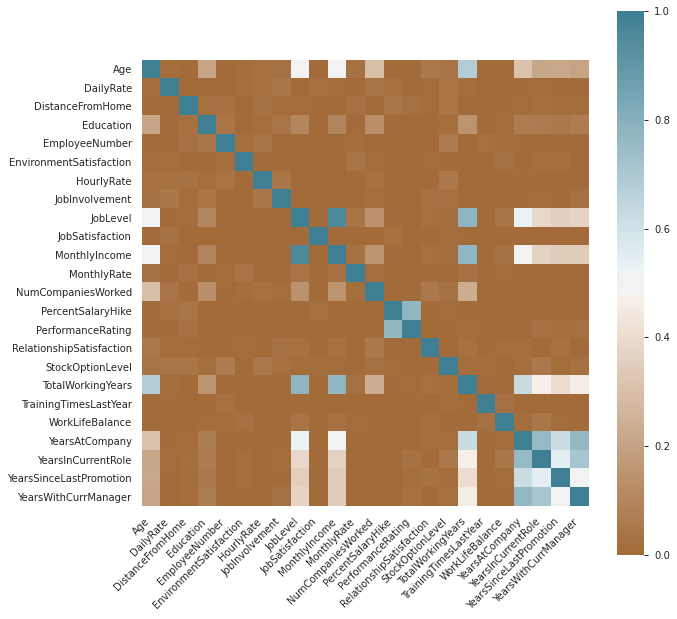

In [43]:
corr = df_num.corr()
plt.figure(figsize=(10, 10))
ax = sns.heatmap(
    corr, 
    vmin=-0, vmax=1,
    cmap=sns.diverging_palette(40, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

Analysing categorical variable and covert them into dummy variable

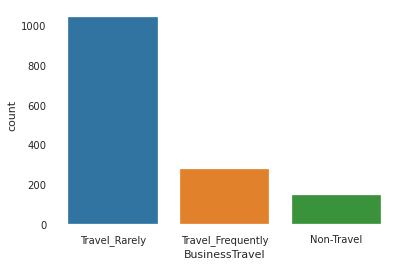

In [44]:
sns.countplot(x="BusinessTravel",data=df_cat)

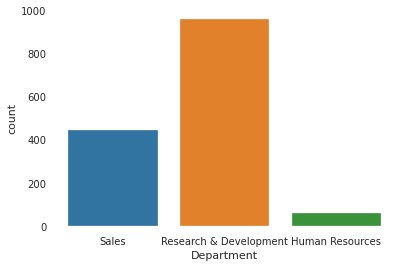

In [45]:
sns.countplot(x="Department",data=df_cat)


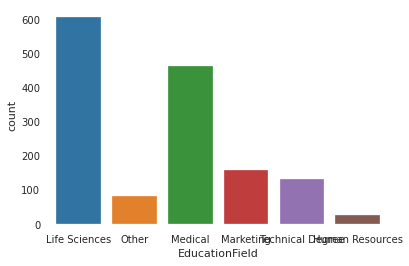

In [46]:
sns.countplot(x="EducationField",data=df_cat)

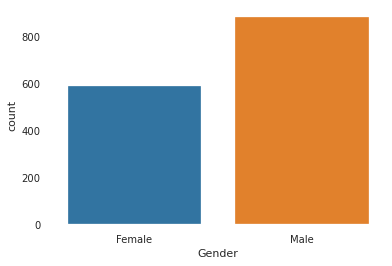

In [47]:
sns.countplot(x="Gender",data=df_cat)

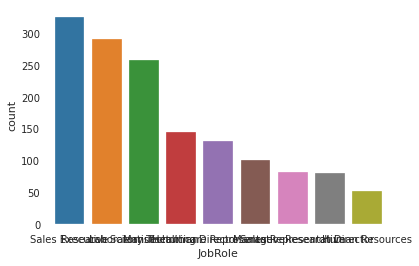

In [48]:
sns.countplot(x="JobRole",data=df_cat)

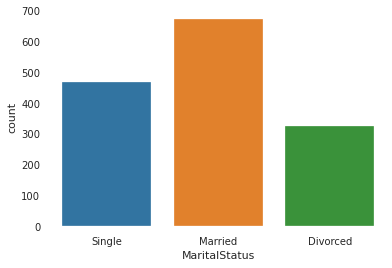

In [49]:
sns.countplot(x="MaritalStatus",data=df_cat)

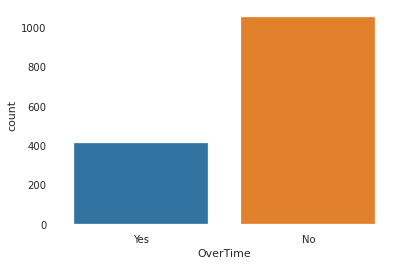

In [50]:
sns.countplot(x="OverTime",data=df_cat)

In [51]:
#conveting categorical variable into numeric 
df_cat = pd.get_dummies(df_cat)
df_cat.head()

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes
0,0,0,1,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,1,0,1
1,0,1,0,0,1,0,0,1,0,0,...,0,0,1,0,0,0,1,0,1,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
3,0,1,0,0,1,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,1
4,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,0,0,1,0,1,0


In [52]:
#transforming target/Attrition variable
target_map = {'Yes':1, 'No':0}
# Use the pandas apply method to numerically encode our attrition target variable
Y= data["Attrition"].apply(lambda x: target_map[x])
Y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int64

In [53]:
#merging categorical and numerical data
new_df= pd.concat([df_cat, df_num], axis=1)
new_df

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,0,1,0,0,1,0,1,0,0,...,3,1,0,8,0,1,6,4,0,5
1,0,1,0,0,1,0,0,1,0,0,...,4,4,1,10,3,3,10,7,1,7
2,0,0,1,0,1,0,0,0,0,0,...,3,2,0,7,3,3,0,0,0,0
3,0,1,0,0,1,0,0,1,0,0,...,3,3,0,8,3,3,8,7,3,0
4,0,0,1,0,1,0,0,0,0,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,...,3,3,1,17,3,3,5,2,0,3
1466,0,0,1,0,1,0,0,0,0,1,...,3,1,1,9,5,3,7,7,1,7
1467,0,0,1,0,1,0,0,1,0,0,...,4,2,1,6,0,3,6,2,0,3
1468,0,1,0,0,0,1,0,0,0,1,...,3,4,0,17,3,2,9,6,0,8


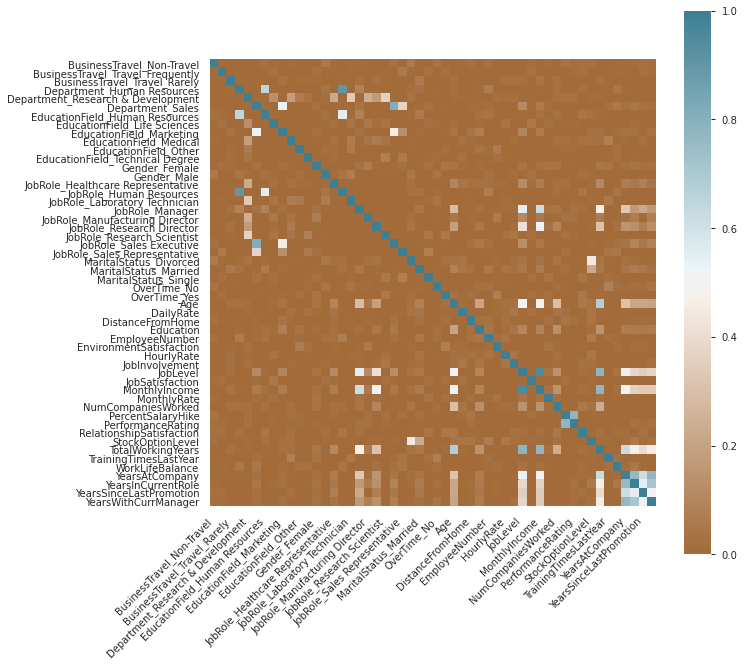

In [54]:
corr =new_df.corr()
plt.figure(figsize=(10, 10))
ax = sns.heatmap(
    corr, 
    vmin=-0, vmax=1,
    cmap=sns.diverging_palette(40, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

No     1233
Yes     237
Name: Attrition, dtype: int64

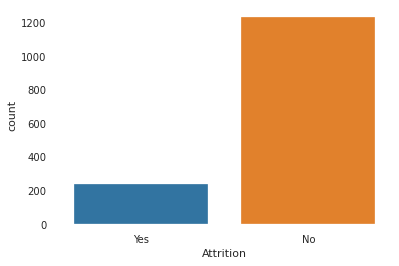

In [55]:
#analysing target variable
sns.countplot(x="Attrition",data=data)
data.Attrition.value_counts()

Rescaling the data using robust scaler

In [56]:
from sklearn.preprocessing import RobustScaler

X=new_df
scaler=RobustScaler()
scaled_df=scaler.fit_transform(X)
X=scaled_df


In [57]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test= train_test_split(X,Y,test_size=0.3,random_state=42)

#  Model building
### KNN- k nearest neighbour

In [58]:
from sklearn.neighbors import KNeighborsClassifier
model= KNeighborsClassifier(n_neighbors=3,n_jobs=-1)
model.fit(X_train,Y_train)
Y_predict=model.predict(X_test)

In [59]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

0.8480725623582767
[[364  16]
 [ 51  10]]
AUC: 0.67


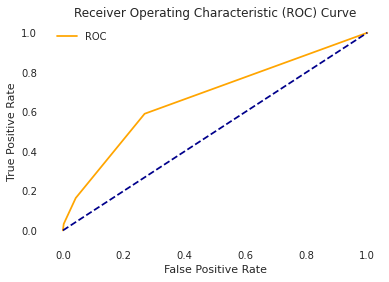

In [60]:
from sklearn.metrics import accuracy_score
print(accuracy_score(Y_test,Y_predict))
print(confusion_matrix(Y_test,Y_predict))


probs=model.predict_proba(X_test)
preds = probs[:,1]

auc = roc_auc_score(Y_test, preds)
print('AUC: %.2f' % auc)
fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc = metrics.auc(fpr, tpr)
plot_roc_curve(fpr, tpr)

84% accuracy and .67 auc_roc is good but this could be misleading and caused by overfitting as data is imbalanced 

***Data is imbalanced and 'yes' in attrition is minority class***
**we need to over sample the minority class and for this we will be using smote (synthetic minority oversampling technique)**

### SMOTE

In [61]:
from imblearn.over_sampling import SMOTE
smote=SMOTE()

In [62]:
from imblearn.over_sampling import SMOTE
smote=SMOTE()
X_train_smote,Y_train_smote=smote.fit_sample(X_train,Y_train)

In [63]:

from collections import Counter
print("Before smote",Counter(Y_train))
print("after smote",Counter(Y_train_smote))


Before smote Counter({0: 853, 1: 176})
after smote Counter({0: 853, 1: 853})


# KNN with SMOTE data

Best Hyper Parameters:
 {'algorithm': 'auto', 'leaf_size': 1, 'n_jobs': -1, 'n_neighbors': 3, 'weights': 'distance'}
Accuracy: 0.5873015873015873
Confusion Metrix:
 [[220  22]
 [160  39]]
ROC_AUC: 0.63


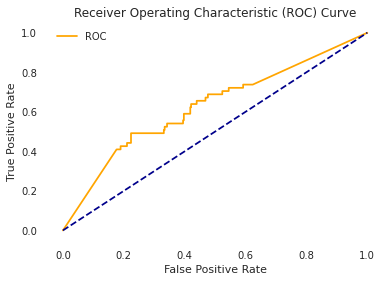

In [64]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

model = KNeighborsClassifier(n_jobs=-1)
params = {'n_neighbors':[3,5,7,9],
          'leaf_size':[1,2,3,5],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree','kd_tree','brute'],
          'n_jobs':[-1]}
#Making models with hyper parameters sets
model1 = GridSearchCV(model, param_grid=params, n_jobs=1)
#Learning
model1.fit(X_train_smote,Y_train_smote)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(X_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,Y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,Y_test))
#evaluation(ROC_AUC)
probs=model1.predict_proba(X_test)
preds = probs[:,1]
auc = roc_auc_score(Y_test, preds)
print('ROC_AUC: %.2f' % auc)

fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc = metrics.auc(fpr, tpr)
plot_roc_curve(fpr, tpr)

After smote KNN is giving accuracy of 62 and auc_roc 64 which is drastic drop from before smote

# Random Forest with SMOTE data

**Random forest with optimization**

0.8480725623582767
[[358  22]
 [ 45  16]]
ROC_AUC: 0.63


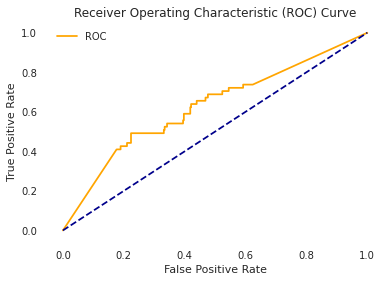

In [65]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer

# Choose the type of classifier. 
clf = RandomForestClassifier()

# Choose some parameter combinations to try
parameters = {'n_estimators': [4, 6, 9], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1,5,8]
             }

# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(accuracy_score)

# Run the grid search
grid_obj = GridSearchCV(clf, parameters, scoring=acc_scorer)
grid_obj = grid_obj.fit(X_train_smote,Y_train_smote)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
clf.fit(X_train_smote,Y_train_smote)

predictions = clf.predict(X_test)
print(accuracy_score(Y_test, predictions))
print(confusion_matrix(Y_test,predictions))
#evaluation(ROC_AUC)
probs=model1.predict_proba(X_test)
preds = probs[:,1]
auc = roc_auc_score(Y_test, preds)
print('ROC_AUC: %.2f' % auc)

fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc = metrics.auc(fpr, tpr)
plot_roc_curve(fpr, tpr)

# SVM with Smote data

Best Hyper Parameters:
 {'C': 11, 'kernel': 'rbf'}
Accuracy: 0.8458049886621315
Confusion Metrix:
 [[355  43]
 [ 25  18]]
ROC_AUC: 0.72


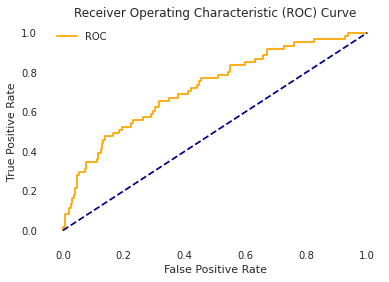

In [66]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm
#making the instance
model=svm.SVC(probability=True)
#Hyper Parameters Set
params = {'C': [6,7,8,9,10,11,12], 
          'kernel': ['linear','rbf']}
#Making models with hyper parameters sets
model1 = GridSearchCV(model, param_grid=params, n_jobs=-1)
#Learning
model1.fit(X_train_smote,Y_train_smote)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(X_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,Y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,Y_test))
#evaluation(ROC_AUC)
probs=model1.predict_proba(X_test)
preds = probs[:,1]
auc = roc_auc_score(Y_test, preds)
print('ROC_AUC: %.2f' % auc)

fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc = metrics.auc(fpr, tpr)
plot_roc_curve(fpr, tpr)


KNN was not very promising with  this data but random forest and svm performed better.

**Please UPVOTE this kernel if you like it. looking for your valuable suggestion. 
Thanks,**